In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df = pd.read_csv('/content/final_nonAdherence.csv')

# EDA

In [ ]:
df.head()

,Unnamed: 0,full_text,label
0,0,I was prescribed adderall for 6 years and had ...,1
1,1,I want to be able to express fear without feel...,0
2,2,Why am I happier when I'm off my meds? I am 23...,1
3,3,First post: My rehabilitation story I would li...,0
4,4,My mom has psychotic depression and I'm at a l...,1


In [ ]:
df.columns

Index(['Unnamed: 0', 'full_text', 'label'], dtype='object')

In [ ]:
df.isnull().sum()

,0
Unnamed: 0,0
full_text,0
label,0


In [ ]:
df['label'].value_counts()

,count
label,
0,1600
1,1447


In [ ]:
df.describe()

,Unnamed: 0,label
count,3047.000000,3047.000000
mean,1616.468330,0.474893
std,931.702028,0.499451
min,0.000000,0.000000
25%,812.500000,0.000000
50%,1619.000000,0.000000
75%,2417.500000,1.000000
max,3229.000000,1.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  3047 non-null   int64 
 1   full_text   3047 non-null   object
 2   label       3047 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 71.5+ KB


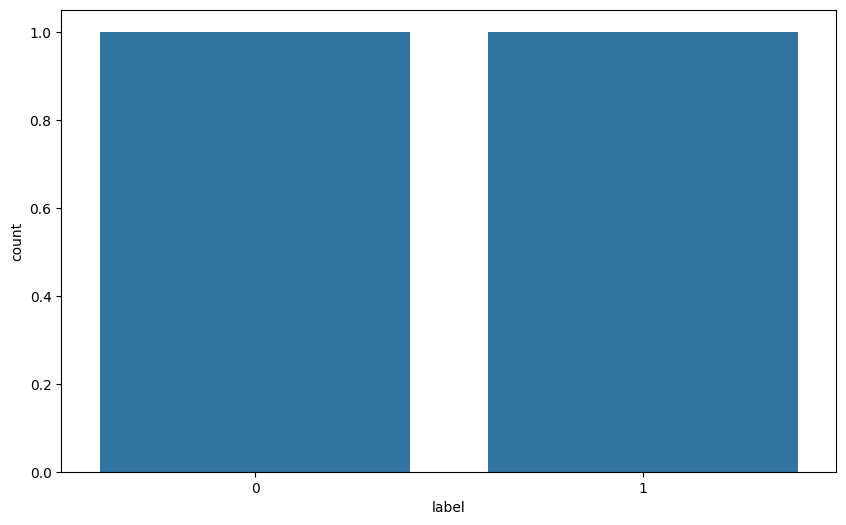

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(df['label'].value_counts())
plt.show()

## Feature Engineering

In [ ]:
df.drop(columns=['Unnamed: 0'],inplace=True)

In [ ]:
import re
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
from bs4 import BeautifulSoup

In [ ]:
## Removing special characters
df['full_text'] = df['full_text'].apply(lambda x: re.sub(r'[^a-zA-Z0-9\s-]', '', x))
## Remove the stopswords
stops = set(stopwords.words('english'))
df['full_text']=df['full_text'].apply(lambda x:" ".join([y for y in x.split() if y not in stops]))
## Remove url
df['full_text']=df['full_text'].apply(lambda x: re.sub(r'(http|https|ftp|ssh)://([\w_-]+(?:(?:\.[\w_-]+)+))([\w.,@?^=%&:/~+#-]*[\w@?^=%&/~+#-])?', '' , str(x)))
## Remove html tags
df['full_text']=df['full_text'].apply(lambda x: BeautifulSoup(x, 'lxml').get_text())
## Remove any additional spaces
df['full_text']=df['full_text'].apply(lambda x: " ".join(x.split()))

In [ ]:
df.head()

,full_text,label
0,I prescribed adderall 6 years devastating expe...,1
1,I want able express fear without feeling negat...,0
2,Why I happier Im meds I 23 I diagnosed major d...,1
3,First post My rehabilitation story I would lik...,0
4,My mom psychotic depression Im loss My mother ...,1


In [ ]:
# Lemmatizer
from nltk.stem import WordNetLemmatizer

In [ ]:
lemmatizer=WordNetLemmatizer()

In [ ]:
def lemmatize_words(text):
  return " ".join([lemmatizer.lemmatize(word) for word in text.split()])

In [ ]:
df['full_text'] = df['full_text'].apply(lambda x:lemmatize_words(x))

In [ ]:
df.head()

,full_text,label
0,I prescribed adderall 6 year devastating exper...,1
1,I want able express fear without feeling negat...,0
2,Why I happier Im med I 23 I diagnosed major de...,1
3,First post My rehabilitation story I would lik...,0
4,My mom psychotic depression Im loss My mother ...,1


In [ ]:
nltk.download('punkt_tab')
!pip install gensim

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [ ]:
import gensim.downloader as api
wv = api.load('word2vec-google-news-300')

[==================================================] 100.0% 1662.8/1662.8MB downloaded


In [ ]:
data = df['full_text']

# Train Test Split

In [ ]:
X = df['full_text']
y = df['label']

In [ ]:
## Train Test Split
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.33,random_state=42)

In [ ]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(2041,)
(1006,)
(2041,)
(1006,)


In [ ]:
from nltk import sent_tokenize
from gensim.utils import simple_preprocess

Sentence tokenization → split big text into smaller, cleaner sentence units.

Word tokenization → convert each sentence into words (tokens) using simple_preprocess

In [ ]:
X_train_words=[]
for sent in X_train:
  sent_token = sent_tokenize(sent)
  for sent in sent_token:
    X_train_words.append(simple_preprocess(sent))

In [ ]:
X_test_words=[]
for sent in X_test:
  sent_token = sent_tokenize(sent)
  for sent in sent_token:
    X_test_words.append(simple_preprocess(sent))

In [ ]:
X_train_words

[['my',
  'ocd',
  'emetophobia',
  'nd',
  'health',
  'anxiety',
  'story',
  'hope',
  'allowed',
  'wanted',
  'share',
  'story',
  'people',
  'may',
  'relate',
  'thanks',
  'advance',
  'also',
  'sorry',
  'formatting',
  'wonky',
  'im',
  'mobile',
  'wrote',
  'note',
  'posting',
  'when',
  'afab',
  'year',
  'old',
  'got',
  'stomach',
  'virus',
  'hadnt',
  'thrown',
  'since',
  'around',
  'experience',
  'completely',
  'overwhelmed',
  'the',
  'entire',
  'time',
  'sick',
  'forced',
  'throw',
  'even',
  'though',
  'really',
  'needed',
  'after',
  'became',
  'terrified',
  'nausea',
  'stomach',
  'issue',
  'anyone',
  'family',
  'getting',
  'sick',
  'in',
  'month',
  'followed',
  'started',
  'waking',
  'middle',
  'night',
  'gi',
  'distress',
  'caused',
  'know',
  'undiagnosed',
  'food',
  'allergy',
  'anxiety',
  'scared',
  'began',
  'bruising',
  'pinching',
  'scratching',
  'forearm',
  'way',
  'cope',
  'when',
  'parent',
  'reali

In [ ]:
X_test_words

[['advice',
  'needed',
  'alternative',
  'antidepressant',
  'yotransm',
  'past',
  'trauma',
  'involving',
  'swallowing',
  'pill',
  'need',
  'take',
  'antidepressant',
  'anxiety',
  'depression',
  'taking',
  'pill',
  'like',
  'chore',
  'everyday',
  'feel',
  'nauseous',
  'thinking',
  'taking',
  'sometimes',
  'cry',
  'start',
  'shaking',
  'tried',
  'different',
  'type',
  'medication',
  'different',
  'form',
  'liquid',
  'powder',
  'dissolveables',
  'etc',
  'taste',
  'horrible',
  'body',
  'cannot',
  'everyday',
  'dont',
  'believe',
  'holistic',
  'medicine',
  'taking',
  'herb',
  'fix',
  'open',
  'trying',
  'anything',
  'please',
  'help'],
 ['even',
  'studying',
  'anything',
  'medicated',
  'ask',
  'question',
  'im',
  'anything',
  'life',
  'moment',
  'im',
  'sometimes',
  'trouble',
  'taking',
  'med',
  'even',
  'thou',
  'reminder',
  'follow',
  'wonde',
  'taking',
  'another',
  'pill',
  'help',
  'better',
  'retaining',
 

In [ ]:
import gensim

In [ ]:
model = gensim.models.Word2Vec(X_train_words,epochs=15,window=3)

In [ ]:
model.wv.index_to_key

['im',
 'like',
 'feel',
 'dont',
 'time',
 'get',
 'ive',
 'day',
 'med',
 'year',
 'know',
 'even',
 'would',
 'want',
 'life',
 'one',
 'thing',
 'really',
 'take',
 'my',
 'go',
 'medication',
 'back',
 'help',
 'people',
 'anxiety',
 'going',
 'cant',
 'also',
 'much',
 'make',
 'think',
 'the',
 'didnt',
 'month',
 'still',
 'never',
 'started',
 'got',
 'taking',
 'thought',
 'work',
 'week',
 'could',
 'but',
 'doctor',
 'need',
 'since',
 'it',
 'something',
 'way',
 'and',
 'went',
 'so',
 'every',
 'he',
 'feeling',
 'anything',
 'first',
 'see',
 'told',
 'better',
 'say',
 'bad',
 'said',
 'last',
 'felt',
 'pain',
 'always',
 'good',
 'getting',
 'lot',
 'mg',
 'depression',
 'friend',
 'well',
 'made',
 'long',
 'everything',
 'symptom',
 'this',
 'right',
 'without',
 'point',
 'sleep',
 'she',
 'its',
 'anyone',
 'worse',
 'nothing',
 'tried',
 'new',
 'family',
 'issue',
 'around',
 'trying',
 'try',
 'stop',
 'ago',
 'psychiatrist',
 'mental',
 'hour',
 'adhd',
 'sch

In [ ]:
model.epochs

15

In [ ]:
model.corpus_count

2041

In [ ]:
model.wv.similar_by_word('medication')

[('med', 0.7652983069419861),
 ('antidepressant', 0.7514507174491882),
 ('medicine', 0.7354649305343628),
 ('ssris', 0.5656173825263977),
 ('seriously', 0.5557987093925476),
 ('benzos', 0.5457449555397034),
 ('treatment', 0.5373228192329407),
 ('ssri', 0.5299711227416992),
 ('antipsychotic', 0.5139334797859192),
 ('zoloft', 0.5135339498519897)]

# Avg Word2Vec

In [ ]:
!pip install tqdm

In [ ]:
from tqdm import tqdm

In [ ]:
def avg_word2vec(doc):
  vec = [model.wv[word] for word in doc if word in model.wv.index_to_key]
  return np.mean(vec,axis=0)

In [ ]:
X = []
for i  in tqdm(range(len(X_train_words))):
  X.append(avg_word2vec(X_train_words[i]))

100%|██████████| 2041/2041 [00:13<00:00, 154.59it/s]


In [ ]:
X2 = []
for i  in tqdm(range(len(X_test_words))):
  X2.append(avg_word2vec(X_test_words[i]))

100%|██████████| 1006/1006 [00:07<00:00, 128.26it/s]


In [ ]:
len(X)

2041

In [ ]:
X=np.array(X)
X2=np.array(X2)

In [ ]:
X

array([[-0.13952999,  0.14155047, -0.04790294, ..., -0.10888244,
        -0.08691538, -0.12537977],
       [-0.17112413,  0.28857893, -0.17680772, ..., -0.2409416 ,
         0.12328077, -0.44690412],
       [-0.08634356,  0.17664367,  0.03234493, ..., -0.0671654 ,
        -0.00744537, -0.13930683],
       ...,
       [-0.12400479,  0.15514715, -0.18439502, ..., -0.19448082,
         0.09950121, -0.12033936],
       [-0.0918848 ,  0.28730255, -0.3181592 , ..., -0.2504864 ,
         0.02995385, -0.2947754 ],
       [-0.11939172,  0.11898381, -0.2402681 , ...,  0.02307753,
        -0.00898526, -0.35184982]], dtype=float32)

In [ ]:
X2

array([[-0.1321145 ,  0.2961474 , -0.23631604, ..., -0.03947929,
        -0.23374261, -0.3028464 ],
       [-0.16861369,  0.39307952, -0.21064198, ..., -0.17712675,
         0.30907175, -0.34373453],
       [-0.24362253,  0.13458478, -0.05762928, ..., -0.22461076,
         0.00834794, -0.25522584],
       ...,
       [-0.19228601,  0.0753268 , -0.05357752, ..., -0.20066616,
         0.19599883, -0.3241438 ],
       [-0.17748824,  0.20551476, -0.05097581, ..., -0.18820299,
         0.17149426, -0.47316438],
       [-0.12348322,  0.09538306,  0.01207344, ..., -0.137056  ,
         0.20935756, -0.20437486]], dtype=float32)

In [ ]:
# Accumulate reshaped arrays in a list
rows = [pd.DataFrame(X[i].reshape(1, -1)) for i in range(len(X))]

# Concatenate all DataFrames at once
X_train = pd.concat(rows, ignore_index=True)

In [ ]:
# Accumulate reshaped arrays in a list
rows = [pd.DataFrame(X2[i].reshape(1, -1)) for i in range(len(X2))]

# Concatenate all DataFrames at once
X_test = pd.concat(rows, ignore_index=True)

In [ ]:
X_train.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-0.139530,0.141550,-0.047903,-0.076249,-0.076625,-0.233404,0.040082,0.354809,-0.112187,-0.206842,...,0.340514,0.115619,0.076921,0.128456,0.295725,0.076269,0.088082,-0.108882,-0.086915,-0.125380
1,-0.171124,0.288579,-0.176808,-0.036519,-0.278539,-0.248465,-0.105006,0.272261,-0.178712,-0.411293,...,0.366119,0.149433,-0.068872,0.082776,0.277189,0.129651,0.189848,-0.240942,0.123281,-0.446904
2,-0.086344,0.176644,0.032345,0.246028,-0.003572,-0.356965,-0.057089,0.426933,-0.104072,-0.106690,...,0.220421,0.175220,-0.196987,0.335961,0.137427,0.049167,-0.039516,-0.067165,-0.007445,-0.139307
3,-0.181098,0.101053,-0.189610,0.190560,-0.106879,-0.250565,-0.034492,0.369130,-0.117032,-0.256854,...,0.421089,0.136002,-0.092475,0.236214,0.252737,0.049716,0.184695,-0.011046,0.221458,-0.189368
4,-0.039443,0.215929,-0.054028,-0.150122,-0.176405,-0.255542,-0.081801,0.415476,-0.127217,-0.403909,...,0.474711,0.104319,0.069493,0.069513,0.320515,0.242237,0.351310,-0.249214,0.126040,-0.666554


In [ ]:
X_test.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-0.132114,0.296147,-0.236316,-0.454513,-0.280816,-0.180483,0.169444,0.049560,-0.119770,-0.114141,...,0.522324,0.092986,0.171700,-0.035689,0.178232,0.188466,0.178125,-0.039479,-0.233743,-0.302846
1,-0.168614,0.393080,-0.210642,-0.213891,-0.411189,-0.367025,-0.068980,0.188694,-0.011808,-0.395877,...,0.592753,0.214436,0.061626,-0.029394,0.124639,0.078655,0.352148,-0.177127,0.309072,-0.343735
2,-0.243623,0.134585,-0.057629,-0.061282,-0.205161,-0.217818,-0.090110,0.435088,-0.061354,-0.230136,...,0.363259,0.121977,0.039141,0.155267,0.336763,0.079598,0.184664,-0.224611,0.008348,-0.255226
3,-0.188837,0.041771,-0.188217,0.048629,0.002322,-0.283691,0.025183,0.357853,-0.153933,-0.184669,...,0.279079,0.110406,0.034596,0.167444,0.254498,0.189510,0.102561,-0.100247,0.148097,-0.081899
4,0.134905,0.277042,-0.223038,0.142045,-0.068938,-0.376894,-0.008203,0.357192,-0.152227,-0.216985,...,0.327617,0.190786,0.125768,0.145119,0.223374,0.259834,0.191931,-0.048161,-0.057930,-0.333348


In [ ]:
X_train.isnull().sum()

,0
0,0
1,0
2,0
3,0
4,0
...,...
95,0
96,0
97,0
98,0


In [ ]:
X_test.isnull().sum()

,0
0,0
1,0
2,0
3,0
4,0
...,...
95,0
96,0
97,0
98,0


In [ ]:
y_train

,label
2281,1
2667,1
632,0
1357,1
2710,1
...,...
1638,0
1095,1
1130,1
1294,0


In [ ]:
y_test

,label
1582,0
2367,0
2091,0
343,1
2661,1
...,...
1764,0
48,0
719,0
1231,0


# Model Training

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report,ConfusionMatrixDisplay, \
                            precision_score, recall_score, f1_score, roc_auc_score,roc_curve

In [ ]:
models={
    "Logisitic Regression":LogisticRegression(),
    "Decision Tree":DecisionTreeClassifier(),
    "Random Forest":RandomForestClassifier(),
    "Gradient Boost":GradientBoostingClassifier(),
    "Adaboost":AdaBoostClassifier(),
    "XgBoost": XGBClassifier()
}

In [ ]:
for i in range(len(list(models))):
    model = list(models.values())[i]
    model.fit(X_train, y_train) # Train model

    # Make predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Training set performance
    model_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
    model_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score
    model_train_precision = precision_score(y_train, y_train_pred) # Calculate Precision
    model_train_recall = recall_score(y_train, y_train_pred) # Calculate Recall
    model_train_rocauc_score = roc_auc_score(y_train, y_train_pred)


    # Test set performance
    model_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
    model_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score
    model_test_precision = precision_score(y_test, y_test_pred) # Calculate Precision
    model_test_recall = recall_score(y_test, y_test_pred) # Calculate Recall
    model_test_rocauc_score = roc_auc_score(y_test, y_test_pred) #Calculate Roc

    print(list(models.keys())[i])

    print('Model performance for Training set')
    print("- Accuracy: {:.4f}".format(model_train_accuracy))
    print('- F1 score: {:.4f}'.format(model_train_f1))

    print('- Precision: {:.4f}'.format(model_train_precision))
    print('- Recall: {:.4f}'.format(model_train_recall))
    print('- Roc Auc Score: {:.4f}'.format(model_train_rocauc_score))



    print('----------------------------------')

    print('Model performance for Test set')
    print('- Accuracy: {:.4f}'.format(model_test_accuracy))
    print('- F1 score: {:.4f}'.format(model_test_f1))
    print('- Precision: {:.4f}'.format(model_test_precision))
    print('- Recall: {:.4f}'.format(model_test_recall))
    print('- Roc Auc Score: {:.4f}'.format(model_test_rocauc_score))


    print('='*35)
    print('\n')

Logisitic Regression
Model performance for Training set
- Accuracy: 0.7163
- F1 score: 0.7136
- Precision: 0.7408
- Recall: 0.6228
- Roc Auc Score: 0.7122
----------------------------------
Model performance for Test set
- Accuracy: 0.7227
- F1 score: 0.7204
- Precision: 0.7384
- Recall: 0.6371
- Roc Auc Score: 0.7180


Decision Tree
Model performance for Training set
- Accuracy: 1.0000
- F1 score: 1.0000
- Precision: 1.0000
- Recall: 1.0000
- Roc Auc Score: 1.0000
----------------------------------
Model performance for Test set
- Accuracy: 0.6988
- F1 score: 0.6990
- Precision: 0.6748
- Recall: 0.6962
- Roc Auc Score: 0.6987


Random Forest
Model performance for Training set
- Accuracy: 1.0000
- F1 score: 1.0000
- Precision: 1.0000
- Recall: 1.0000
- Roc Auc Score: 1.0000
----------------------------------
Model performance for Test set
- Accuracy: 0.7783
- F1 score: 0.7784
- Precision: 0.7609
- Recall: 0.7722
- Roc Auc Score: 0.7780


Gradient Boost
Model performance for Training se

In [ ]:
## Hyperparameter Training
xgboost_param={"learning_rate": [0.1, 0.01],
                  "max_depth": [5, 8, 12, 20, 30],
                  "n_estimators": [100, 200, 300],
                  "colsample_bytree": [0.5, 0.8, 1, 0.3, 0.4]}

rf_params = {"max_depth": [5, 8, 15, None, 10],
             "max_features": [5, 7, "auto", 8],
             "min_samples_split": [2, 8, 15, 20],
             "n_estimators": [100, 200, 500, 1000]}

In [ ]:
rf_params

{'max_depth': [5, 8, 15, None, 10],
 'max_features': [5, 7, 'auto', 8],
 'min_samples_split': [2, 8, 15, 20],
 'n_estimators': [100, 200, 500, 1000]}

In [ ]:
randomcv_models = [
                   ("RF", RandomForestClassifier(), rf_params),
                   ("XGB", XGBClassifier(), xgboost_param)
                   ]

In [119]:
from sklearn.model_selection import RandomizedSearchCV

model_param = {}

for name, model, params in randomcv_models:
    random = RandomizedSearchCV(estimator=model,param_distributions=params,
                                n_iter=100,
                                n_jobs=-1,
                                verbose=3,
                                cv=3)


    random.fit(X_train,y_train)
    model_param[name] = random.best_params_

    for model_name in model_param:
        print(f"---------------- Best Params for {model_name} -------------------")
        print(model_param[model_name])

Fitting 3 folds for each of 100 candidates, totalling 300 fits


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
69 fits failed out of a total of 300.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
22 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.11/dist-packages/sklearn/utils/

---------------- Best Params for RF -------------------
{'n_estimators': 200, 'min_samples_split': 2, 'max_features': 8, 'max_depth': None}
Fitting 3 folds for each of 100 candidates, totalling 300 fits
---------------- Best Params for RF -------------------
{'n_estimators': 200, 'min_samples_split': 2, 'max_features': 8, 'max_depth': None}
---------------- Best Params for XGB -------------------
{'n_estimators': 300, 'max_depth': 12, 'learning_rate': 0.1, 'colsample_bytree': 0.8}


In [120]:
models={
    "Random Forest":RandomForestClassifier(n_estimators= 200, min_samples_split= 2, max_features= 8, max_depth= None),
    "XgBoost": XGBClassifier(n_estimators= 300, max_depth= 12, learning_rate= 0.1, colsample_bytree= 0.8)
}





for i in range(len(list(models))):
    model = list(models.values())[i]
    model.fit(X_train, y_train) # Train model

    # Make predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Training set performance
    model_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
    model_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score
    model_train_precision = precision_score(y_train, y_train_pred) # Calculate Precision
    model_train_recall = recall_score(y_train, y_train_pred) # Calculate Recall
    model_train_rocauc_score = roc_auc_score(y_train, y_train_pred)


    # Test set performance
    model_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
    model_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score
    model_test_precision = precision_score(y_test, y_test_pred) # Calculate Precision
    model_test_recall = recall_score(y_test, y_test_pred) # Calculate Recall
    model_test_rocauc_score = roc_auc_score(y_test, y_test_pred) #Calculate Roc

    print(list(models.keys())[i])

    print('Model performance for Training set')
    print("- Accuracy: {:.4f}".format(model_train_accuracy))
    print('- F1 score: {:.4f}'.format(model_train_f1))

    print('- Precision: {:.4f}'.format(model_train_precision))
    print('- Recall: {:.4f}'.format(model_train_recall))
    print('- Roc Auc Score: {:.4f}'.format(model_train_rocauc_score))



    print('----------------------------------')

    print('Model performance for Test set')
    print('- Accuracy: {:.4f}'.format(model_test_accuracy))
    print('- F1 score: {:.4f}'.format(model_test_f1))
    print('- Precision: {:.4f}'.format(model_test_precision))
    print('- Recall: {:.4f}'.format(model_test_recall))
    print('- Roc Auc Score: {:.4f}'.format(model_test_rocauc_score))


    print('='*35)
    print('\n')

Random Forest
Model performance for Training set
- Accuracy: 1.0000
- F1 score: 1.0000
- Precision: 1.0000
- Recall: 1.0000
- Roc Auc Score: 1.0000
----------------------------------
Model performance for Test set
- Accuracy: 0.7823
- F1 score: 0.7823
- Precision: 0.7696
- Recall: 0.7679
- Roc Auc Score: 0.7815


XgBoost
Model performance for Training set
- Accuracy: 1.0000
- F1 score: 1.0000
- Precision: 1.0000
- Recall: 1.0000
- Roc Auc Score: 1.0000
----------------------------------
Model performance for Test set
- Accuracy: 0.8002
- F1 score: 0.8002
- Precision: 0.7886
- Recall: 0.7869
- Roc Auc Score: 0.7995


